<a href="https://colab.research.google.com/github/tzlilLV97/Task4_Deep_Learning/blob/main/TZLILLLLLL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Assignment 4 - Variational Autoencoders**

In this assignment, we will train a model to produce new human faces with variational autoencoders (VAEs). 
Variational autoencoders let us design complex generative models of data, and fit them to large datasets. They can generate images of fictional celebrity faces (as we'll do in this assignment), high-resolution digital artwork and many more tasks. These models also yield state-of-the-art machine learning results in image generation and reinforcement learning. Variational autoencoders (VAEs) were defined in 2013 by Kingma and Wellings [1].

In this assignment, you will build, train and analyze a VAE with the CelebA dataset. You will analyze how well images can be reconstructed from the lower dimensional representations and try to generate images that look similar to the images in the CelebA dataset.

[1] Kingma, Diederik P., and Max Welling. "Auto-encoding variational bayes." arXiv preprint arXiv:1312.6114 (2013). 


# **Section 1: Variational Autoencoders**


Let us recall the structure of the variational autoencoder:

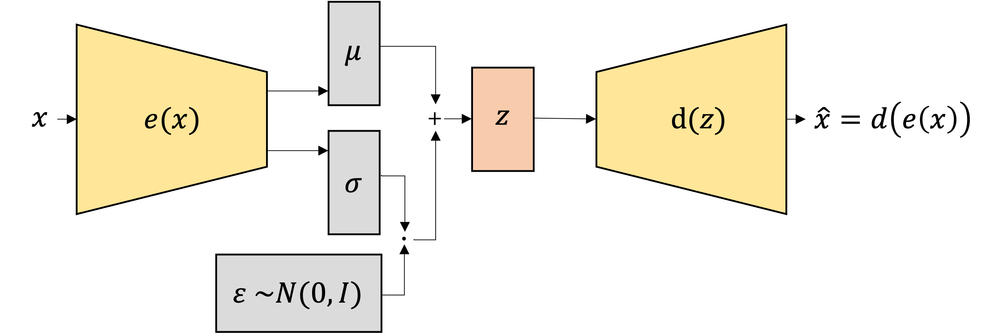

**Imports**

Before we begin, we import the needed libraries. 


You may modify the starter code as you see fit, including changing the signatures of
functions and adding/removing helper functions. However, please make sure that we can understand what you are doing and why.

In [1]:
from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable
import torch
import torch.nn as nn
import torch.nn.functional as nnF
from torchvision.utils import make_grid
import torch.utils.data as data_utils
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import torchvision.transforms.functional as F
from torchvision.utils import make_grid
import os
import zipfile

%pip install wget   
import wget

# use GPU for computation if possible: Go to RUNTIME -> CHANGE RUNTIME TYPE -> GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=0eaeaa17dcb6e71f6c0919169355713974840f8f7ac0d5a9044e366dab92c961
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget


Connect to your Google Drive, select the path in your drive for saving the checkpoints of your model, which we will train later.

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

# Path to save the dataset.
PATH_TO_SAVE_MODEL = '/content/gdrive/MyDrive/Colab Notebooks' # TODO - UPDATE ME!

Mounted at /content/gdrive


Define random seeds in order to reproduce your results.

In [3]:
# TO DO: Set random seeds - to your choice
torch.manual_seed(42)         # Insert any integer
torch.cuda.manual_seed(42)    # Insert any integer

## Question 1. Basic Principles (10 %)




### Part (a) -- 3%

What is the difference between deterministic autoencoder we saw in class and the variational autoencoder? 

In [4]:
# The main difference between a deterministic autoencoder and a variational autoencoder is the way in which the latent representation (Z) is generated.
# In a deterministic autoencoder, the latent representation is a fixed, deterministic mapping of the input. This means that if the autoencoder receives the same input multiple times, it will always produce the same output.
# In contrast, in a variational autoencoder, the latent representation is a random variable, whose distribution is determined by the encoder mapping. 
# This means that if the autoencoder receives the same input multiple times, it will produce different outputs, as the latent representation is generated randomly from a distribution.

### Part (b) -- 3%
In which manner Variational Autoencoder is trained? Explain.


In [5]:
# Write your explanation here
# VAEs are train


### Part (c) -- 4%

In class we saw another generative model, known as generative adversarial network (GAN). What are the differences in terms of task objective between GANs and VAEs? Give an example for a task which a VAE is more suitable than GAN, and vice versa.

In [6]:
# Write your explanation here

## Question 2. Data (15 %)

In this assignement we are using the CelebFaces Attributes Dataset (CelebA).

The CelebA dataset, as its name suggests, is comprised of celebrity faces. The images cover large pose variations, background clutter, diverse people, supported by a large quantity of images and rich annotations. This data was originally collected by researchers at MMLAB, The Chinese University of Hong Kong.

**Overall**

- 202,599 number of face images of various celebrities
- 10,177 unique identities, but names of identities are not given
- 40 binary attribute annotations per image
- 5 landmark locations

In this torchvision version of the dataset, each image is in the shape of
$[218,178,3]$ and the values are in $[0,1]$.

Here, you will download the dataset to the Google Colab disk. It is highly recommended not to download the dataset to your own Google Drive account since it is time consuming.

In [7]:
data_path = "datasets" ## TO DO -- UPDATE ME!

base_url = "https://graal.ift.ulaval.ca/public/celeba/"

file_list = [
    "img_align_celeba.zip",
    "list_attr_celeba.txt",
    "identity_CelebA.txt",
    "list_bbox_celeba.txt",
    "list_landmarks_align_celeba.txt",
    "list_eval_partition.txt",
]
 
# Path to folder with the dataset
dataset_folder = f"{data_path}/celeba"
os.makedirs(dataset_folder, exist_ok=True)

for file in file_list:
    url = f"{base_url}/{file}"
    if not os.path.exists(f"{dataset_folder}/{file}"):
        wget.download(url, f"{dataset_folder}/{file}")

with zipfile.ZipFile(f"{dataset_folder}/img_align_celeba.zip", "r") as ziphandler:
    ziphandler.extractall(dataset_folder)

### Part (a) -- 5%

Apply transformations:

The data is given as PIL (Python Imageing Library) images. Since we are working with PyTorch, we wish to apply transformations to the data in order to process it properly.

Here you should apply transformations to the data. There are many kinds of transformations which can be found here: https://pytorch.org/vision/stable/transforms.html. Note that transformations can be chained together using Compose method.

Think which transformations can be suitable for this task and apply it in the form of: 

trfm = transforms.Compose([transforms.transform1(),transforms.transform2(),...])

We recommend to consider:
- transforms.ToTensor()
- transforms.Resize()

In [8]:

# Define the transformer using the FirstElementTransformer class
#trfm = transforms.Compose([FirstElementTransformer(), transforms.Resize(size=(218,178))])
trfm = transforms.Compose([transforms.ToTensor(),transforms.Resize(size=(218,178))]) # You can add additional transformations which you think could be fit to the data.

training_data = datasets.CelebA(root=data_path, split='train', download=False, transform=trfm)#load the dataset (without download it directly) from our root directory on google drive disk. 
test_data = datasets.CelebA(root=data_path, split='test', download=False, transform=trfm)

In [9]:

print(len(training_data)) 
print(training_data[0][0].shape) ##EXEPCTED [218,178,3]

162770
torch.Size([3, 218, 178])


### Part (b) -- 5%

In order to get in touch with the dataset, and to see what we are dealing with (which is always recommended), we wish to visualize some data samples from the CelebA dataset.

Write a function: show():

INPUT: Python list of length 32 where each element is an image, randomly selected from the training data.

OUTOUT: Showing a 8X4 grid of images.

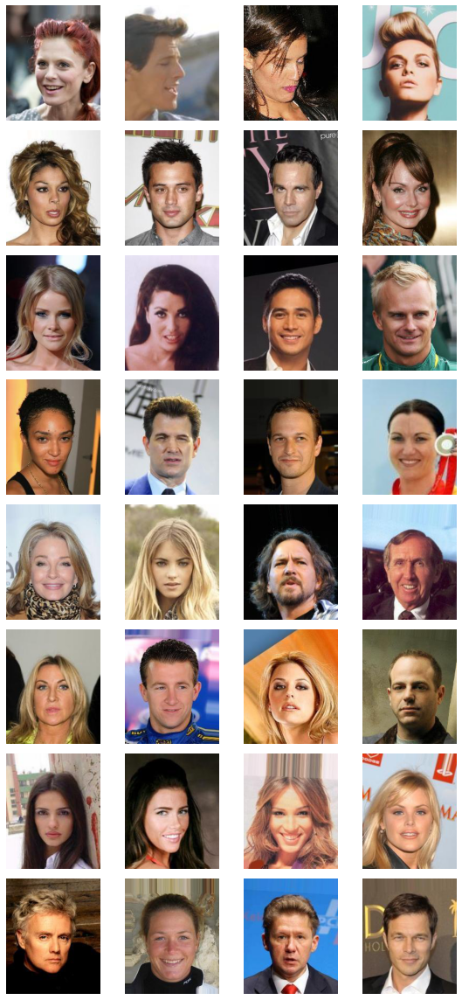

In [10]:
import matplotlib.pyplot as plt
def show(imgs):
    # if len(imgs)!=32:
    #   return None
    plt.figure(figsize=(8,16))
    for idx,celeb in enumerate(imgs):
      plt.subplot(8, 4, idx+1)
      plt.axis('off')
      plt.imshow(celeb[0].permute(1,2,0))
    plt.tight_layout()
    return None

show(data_utils.Subset(training_data,torch.arange(1,33)))

### Part (c) -- 5%

Extrapolate in the image domain:

Here, randomly take 2 images from the training dataset, combine them together and plot the result. For example, consider $X_1$ and $X_2$ to be 2 images randomly taken from the training data. Plot $\alpha\cdot X_1 + (1-\alpha)\cdot X_2$. 

Explain the results, is extrapolation in the image domain reasonable?

Note: Recall that the images should be in the $[0,1]$ interval.

In [11]:
# Your code goes here
def generate_random_numbers(start, stop):
    # Generate the first random number
    num1 = random.randint(start, stop-1)
    # Generate the second random number
    num2 = random.randint(start, stop-1)
    return (num1, num2)
(a,b) = generate_random_numbers(0,len(training_data))
# A = training_data[a]
# B = training_data[b]
# alpha=0.2
# print(a)
# print(b)
# def combine(img1,img2,alpha):
#   plt.imshow(img1*alpha+(1-alpha)*img2)
# combine(A[0].permute(1,2,0),B[0].permute(1,2,0),alpha)


In [12]:
# Your explanation goes here:
# The results of extrapolation in the image domain are not necessarily reasonable because there is no logical relationship between the two images
# being combined. The resulting image is simply a combination of two images, 
# with each pixel value being a weighted average of the corresponding pixel values in the two images.
# When the two images have very different structures or the weights are close to 0 or 1, the resulting image may appear unrealistic or distorted.
# This is because the pixel values from one image are given a very small weight, making it difficult to distinguish from the other image.
# In these cases, extrapolation may produce unrealistic or distorted results. It is important to carefully consider the suitability of 
# extrapolation for a given image dataset and to validate the results of extrapolation to ensure that they are reasonable and accurate.

## Question 3. VAE Foundations (15 %)


Let us start by recalling the analytical derivation of the VAE.


The simplest version of VAE is comprised of an encoder-decoder architecture.
The *encoder* is a neural network which its input is a datapoint $x$, its output is a hidden representation $z$, and it has weights and biases $\theta$. We denote the encoder's mapping by $P_{\theta}(z|x)$. The *decoder* is another neural network which its input is the data sample $z$, its output is the reconstructed input $x$, and its parameters $\phi$. Hence, we denote the decoder's mapping by $P_{\phi}(x|z)$.

The goal is to determine a posterior distribution $P_{\theta}(z|x)$ of a latent variable $z$ given some data evidence $x$. However, determining this posterior distribution is typically computationally intractable, because according to Bayes:

$(1)$ $P(z|x) = \frac{P(x|z)P(z)}{P(x)}$

The term $P(x)$ is called the evidence, and we can calculate it by marginalization on the latent variable:

$P(x) = \int_{z}P(x|z)P(z)dz$

Unfortunately, this term is intractable because it requires computation of the integral over the entire latent space $z$. To bypass this intractability problem we approximate the posterior distribution with some other distribution $q(z|x_i)$. This approximation is made by the KL-divergence:

$(2)$ $D_{KL}\big(q(z|x_i)||P(z|x_i)\big) = \int_{z}q(z|x_i)\cdot\log\big(\frac{q(z|x_i)}{P(z|x_i)}\big)dz = -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(z|x_i)}{q(z|x_i)}\big)dz \geq 0$

Applying Bayes’ theorem to the above equation yields,

$(3)$ $D_{KL}\big(q(z|x_i)||P(z|x_i)\big) = -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)P(x_i)}\big)dz \geq 0$

This can be broken down using laws of logarithms, yielding,

$(4)$ $-\int_{z}q(z|x_i)\cdot\big[\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)-\log(P(x_i))\big]dz \geq 0$

Distributing the integrand then yields,

$(5)$ $-\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz+\int_{z}q(z|x_i)\log(P(x_i))dz \geq 0$

In the above, we note that $log(P(x))$ is a constant and can therefore be pulled out of the second integral above, yielding,

$(6)$ $-\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz+\log(P(x_i))\int_{z}q(z|x_i)dz \geq 0$

And since $q(z|x_i)$ is a probability distribution it integrates to 1 in the above equation, yielding,

$(7)$ $-\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz+\log(P(x_i)) \geq 0$

Then carrying the integral over to the other side of the inequality, we get,

$(8)$ $\log(P(x_i)) \geq \int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz$

<!-- Applying rules of logarithms, we get,

$(9)$ $\log(P(x)) \geq \int_{z}q(z|x)\cdot\big[\log\big(P(x|z)\big)+\log\big(P(z)\big)-\log\big(q(z|x)\big)\big]dz$

Recognizing the right hand side of the above inequality as Expectation, we write,

$(10)$ $\log(P(x)) \geq E_{~q(z|x)}\big[\log\big(P(x,z)\big)-\log\big(q(z|x)\big)\big]dz$ -->

From Equation $(8)$ it follows that:

$(9)$ $\log(P(x_i)) \geq \int_{z}q(z|x_i)\cdot\log\big(\frac{P(z)}{q(z|x_i)}\big)dz + \int_{z}q(z|x_i)\cdot\log\big(P(x_i|z)\big)dz$

Which is equivalent to:

$(10)$ $\log(P(x_i)) \geq -D_{KL}\big(q(z|x_i)||P(z)\big) + E_{~q(z|x_i)}\big[\log\big(P(x_i|z)\big)\big]$



The right hand side of the above equation is the Evidence Lower BOund (ELBO). Its bounds $\log(P(x))$ which is the term we seek to maximize. Therefore, maximizing the ELBO maximizes the log probability of our data. 


### Part (a) -- 5%
 A we see above, the $ELBO = -D_{KL}\big(q(z|x_i)||P(z)\big) + E_{~q(z|x_i)}\big[\log\big(P(x_i|z)\big)\big]$ is comprised of 2 terms. Explain the meaning of each one of them in terms of a loss function.



In [13]:
# Write your explanation here
# The first One is minus the KL Divergence between the posteriori Probability function and the Probability P(z),
# Where we usally don't know the disturbition of Z, so we can do things like Variational Approximation or 
# The Reparameterization Trick As we mentioned before.
# The KL Divergence in this form reperesent the similarity between the distribution functions, 
# And here it means the similarity between the learned probabilistic encoder and the desired marginal of the latent. 
# The Other Component is the Cross Entropy, which describes the accuracy of the decoder in matching the input distrubition,
# In Simpler terms, The cross entropy here between the probability that the input X , we get Z out of the encoder, 
#and between the probability that the output will be X of the decoder, when the input is Z. When Maximizing the Cross Entropy, it mean 
# that the reconstruction is of better quality, and when Minimizing The Divergnece, 
# it means the probabilities that the divergence contain will be more
# similar to each other, because when the Divergence reach 0, it means that the two disturbitions are the same. 
# So to conclude, when Maximize the ELBO expression, we presume to achieve better reconstruction of the input, and 
# achieve better similarity between the learned probablistic encoder and the desired marginal of the latent.
# Another Thing worth mentioning, That The ELBO formula has a similaity the Entropy q(z|xi) 

### Part (b) -- 10%

 As we saw in class, in traditional variational autoencoder we assume:

$P(z)$ ~ $N(\mu_p,\sigma_{p}^2) = \frac{1}{\sqrt{2\pi\sigma_{p}^2}}\exp\big(-\frac{(z-\mu_p)^2}{2\sigma_{p}^2}\big)$

and

$q(z|x)$ ~ $N(\mu_q,\sigma_{q}^2) = \frac{1}{\sqrt{2\pi\sigma_{q}^2}}\exp\big(-\frac{(z-\mu_q)^2}{2\sigma_{q}^2}\big)$

Assume $\mu_p = 0$ and $\sigma_{p}^2 = 1$. Show that:

$ -D_{KL}\big(q(z|x_i)||P(z)\big) = \frac{1}{2}\big[1+\log(\sigma_{q}^2)-\sigma_{q}^2-\mu_q^2\big]$ 

 

**WRITE YOUR SOLUTIUON HERE**. (You can also upload your solution as an image.)





**Minimizing** the loss function, over a batch in the dataset now can be written as:

$\mathcal{L(\theta,\phi)} = -\sum_j^J\bigg(\frac{1}{2}\big[1+\log(\sigma_{q_j}^2)-\sigma_{q_j}^2-\mu_{q_j}^2\big]\bigg) - \frac{1}{M}\sum_i^M\bigg(E_{~q_{\theta}(z|x_i)}\big[\log\big(P_{\phi}(x_i|z)\big)\big]\bigg)$

where $J$ is the dimension of the latent vector $z$ and $M$ is the number of samples stochastically drawn from the dataset.

## Question 4. VAE Implementation (25 %)

As seen in class, a suitable way to extract features from dataset of images is by convolutional neural network (CNN). Hence, here you will build a convolutional VAE.
\
The basic idea is to start from full resolution images, and by convolutional kernels extract the important features of the dataset. Remember that the output of the VAE should be in the same dimensions $(H_1,W_1,C_1)$ as the input images. 

**The encoder** should be comprised of convolutional layers (nn.Conv2d). Recall that the dimension of the input images is changing according to:

$Z = \bigg(H_2(=\frac{H_1-F+2P}{S}+1),W_2(=\frac{W_1-F+2P}{S}+1),C_2\bigg)$

where $S$ is the stride, $F$ is the kernel size, $P$ is the zero padding and $C_2$ is the selected output channels. $Z$ is the output image.

**The decoder** should reconstruct the images from the latent space. In order to enlarge dimensions of images, your network should be comprised of transposed convolutional layers (nn.ConvTranspose2d). See the following images of the operation of transpose convolution to better understand the way it works.




***Transposed Convolution with Stride = 1***

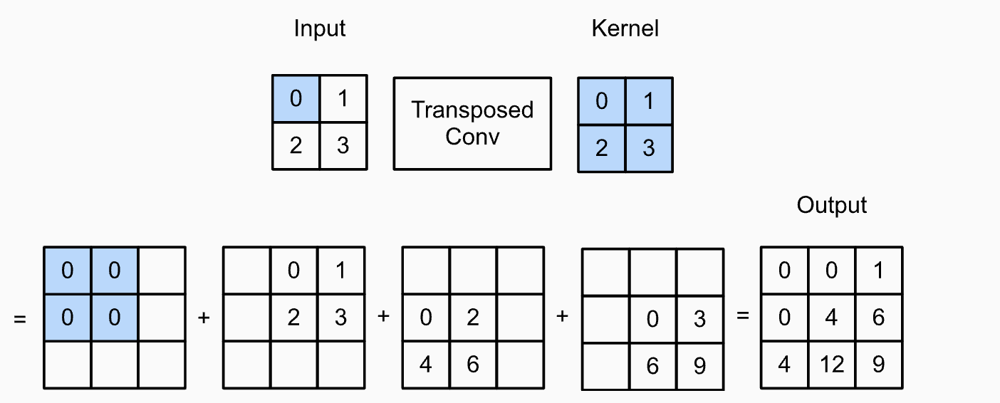

***Transposed Convolution with Stride = 2***
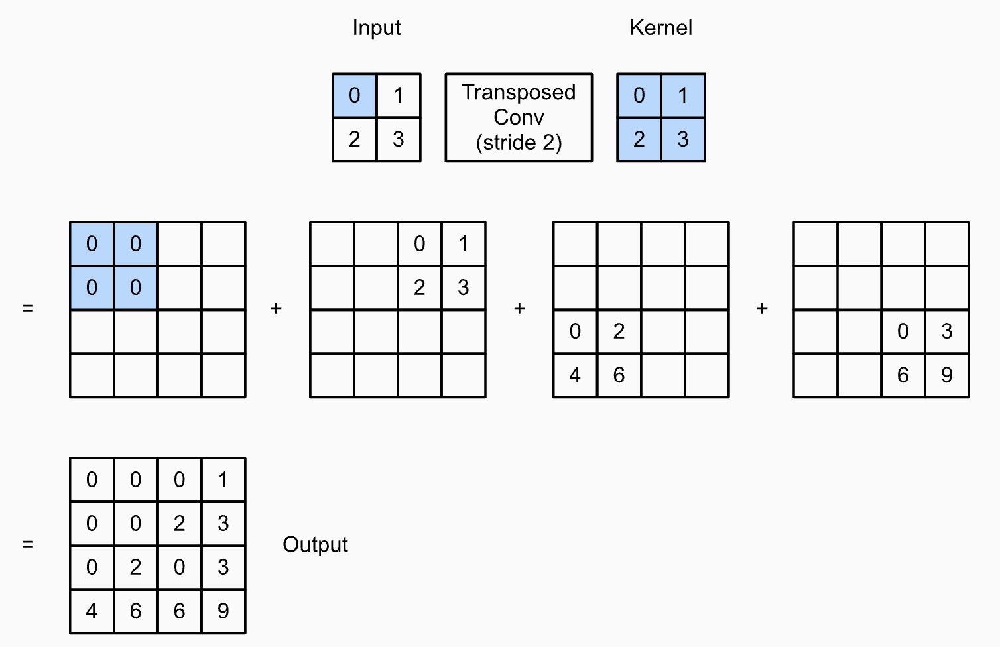

The architecture of your VAE network should be in the following form:


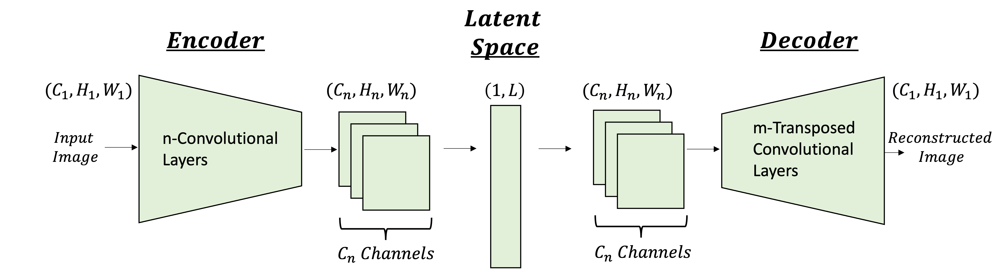

### Part (a) -- 7%

 **Encoder**

Here, you will implement the architecture of the encoder. 

The encoder should consist of 4 Blocks as follows:

BLOCK 1: 
- Convolutional layer (nn.Conv2D(in_channels, num_hidden, kernel_size=(3,3), stride=(2,2)))
- Batch Normalization(num_hidden)
- Activation Function: nn.ReLU()

BLOCK 2: 
- Convolutional layer (nn.Conv2D(num_hidden, num_hidden * 2, kernel_size=(3,3), stride=(2,2))
- Batch Normalization(num_hidden * 2)
- Activation Function: nn.ReLU()

BLOCK 3: 
- Convolutional layer (nn.Conv2D(num_hidden * 2, num_hidden * 4, kernel_size=(3,3), stride=(2,2))
- Batch Normalization(num_hidden * 4)
- Activation Function: nn.ReLU()

BLOCK 4: 
- Convolutional layer (nn.Conv2D(num_hidden * 4, num_hidden * 8, kernel_size=(3,3), stride=(2,2))
- Batch Normalization(num_hidden * 8)
- Activation Function: nn.ReLU()

In addidion to the 4 Blocks, you should add the following linear layers:

Linear $\mu$: 
- nn.Linear( ___ ,latent). 

Linear $\log(\sigma)$: 
- nn.Linear( ___ ,latent).

**NOTES:** 

- The input of the linear layer should be according to the size of the images you picked in the transformation part. (If you did resize the images)

- Consider using Padding in the convolutional layers to correct mismatches in sizes.

- In the forward function, you will have to reshape the output from the 4'th block to $(Batch\cdot H_4\cdot W_4\cdot C_4 , latent)$, where $(Batch$ is the batch size, $H_4$ is the height of the output image from the 4'th block, $W_4$ is the width of the output image from the 4'th block and $C_4$ is num_hidden*8 (number of channels of the output image from the 4'th block).

**You can change any parameter of the network to suit your code - this is only a recommendation.**

In [14]:
class Encoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, latent):
        super(Encoder, self).__init__()
        # YOUR CODE GOES HERE:

        self.num_hiddens = num_hiddens
        self.latent = latent
        self.block1 = nn.Sequential(nn.Conv2d(in_channels, num_hiddens, kernel_size=(3,3), stride=(2,2),padding=(1,1)),
                                    nn.BatchNorm2d(num_hiddens),
                                    nn.ReLU())
        self.block2 = nn.Sequential(nn.Conv2d(num_hiddens, 2*num_hiddens, kernel_size=(3,3), stride=(2,2),padding=(1,1)),
                                    nn.BatchNorm2d(2*num_hiddens),
                                    nn.ReLU())
        self.block3 = nn.Sequential(nn.Conv2d(2*num_hiddens, 4*num_hiddens, kernel_size=(3,3), stride=(2,2),padding=(1,1)),
                                    nn.BatchNorm2d(4*num_hiddens),
                                    nn.ReLU())
        self.block4 = nn.Sequential(nn.Conv2d(4*num_hiddens, 8*num_hiddens, kernel_size=(3,3), stride=(2,2),padding=(1,1)),
                                    nn.BatchNorm2d(8*num_hiddens),
                                    nn.ReLU())

        self.fc_mu = (nn.Linear(8*num_hiddens*12*14, latent))
            # Insert the input size
        self.fc_logvar = (nn.Linear(8*num_hiddens*12*14, latent))
        # Insert the input size

    def forward(self, inputs):
      #  print("MADAFAKA")
        x = self.block1(inputs)
      #  print(x.shape)
        x = self.block2(x)
      #  print(x.shape)
        x = self.block3(x)
      #  print(x.shape)
        x = self.block4(x)
      #  print(x.shape)
        x = x.view(x.size(0), -1)
       # print(x.shape)
      #  print("END MADAFKA")
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

**Notice: We output $\log\sigma$ and not $\sigma^2$, this is a convention when training VAEs but it is completely equivalent.**

### Part (b) -- 7%
 **Decoder**

Here, you will implement the architecture of the decoder. 

First, Apply a linear layer to the input of the decoder as follows:

- nn.Linear(latent, ___ ).

The output of the linear layer should match to $Batch\cdot H_4\cdot W_4\cdot C_4$, which were the same parameters from the encoder 4'th block's output.

Then, the decoder should consist of 4 Blocks as follows:

BLOCK 1: 
- Transposed Convolutional layer (nn.ConvTranspose2d(in_channels, num_hidden // 2, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 2)
- Activation Function: nn.ReLU() or nn.LeakyReLU()

BLOCK 2: 
- Transposed Convolutional layer (nn.ConvTranspose2d(num_hidden // 2, num_hidden // 4, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 4)
- Activation Function: nn.ReLU() or nn.LeakyReLU()

BLOCK 3: 
- Transposed Convolutional layer (nn.ConvTranspose2d(num_hidden // 4, num_hidden // 8, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 8)
- Activation Function: nn.ReLU() or nn.LeakyReLU()

BLOCK 4: 
- Transposed Convolutional layer (nn.ConvTranspose2d(num_hidden // 8, num_hidden // 8, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 8)
- Activation Function: nn.ReLU() or nn.LeakyReLU()


Afterwards, we should generate an image in the same size as our input images. Thus add 1 more block consisting of:

BLOCK 5:
 - nn.Conv2d(num_hiddens//8, out_channels=3,kernel_size=(3,3), stride=(1,1), padding=(1,1)),
 - Activation function.

**NOTES:** 

- The output of the linear layer should be according to the size of the images you picked in the transformation part. (If you did resize the images)

- Consider using Padding in the  transposed convolutional layers to correct mismatches in sizes.

- In the forward function, you will have to reshape the output of the linear layer to ($Batch, H_4, W_4, C_4$)

- The output of the decoder should be of values in $[0,1]$.



**You can change any parameter of the network to suit your code, this is only a recommendation.**

In [15]:

class Decoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, latent):
        super(Decoder, self).__init__()
        self.num_hiddens = num_hiddens
        self.fc_dec = nn.Linear(latent, 12*14*num_hiddens)


        self.block1 = nn.Sequential(nn.ConvTranspose2d(in_channels,num_hiddens//2, kernel_size=(4,4),stride=(2,2),padding=(1,1)),
                                    nn.BatchNorm2d(num_hiddens//2),
                                    nn.LeakyReLU())

        self.block2 = nn.Sequential(nn.ConvTranspose2d(num_hiddens//2,num_hiddens//4, kernel_size=(4,4), stride=(2,2),padding=(2,2)),
                                    nn.BatchNorm2d(num_hiddens//4),
                                    nn.LeakyReLU())

        self.block3 = nn.Sequential(nn.ConvTranspose2d(num_hiddens//4,num_hiddens//8, kernel_size=(4,4), stride=(2,2),padding=(0,2)),
                                    nn.BatchNorm2d(num_hiddens//8),
                                    nn.LeakyReLU())

        self.block4 = nn.Sequential(nn.ConvTranspose2d(num_hiddens//8,num_hiddens//8, kernel_size=(4,4), stride=(2,2),padding=(2,2)),
                                    nn.BatchNorm2d(num_hiddens//8),
                                    nn.LeakyReLU())

        self.block5 = nn.Sequential(nn.Conv2d(num_hiddens//8,out_channels=3,kernel_size=(3,3),stride=(1,1),padding=(1,1)),
                                    nn.Sigmoid())
                                      # Add convolution layer and activation layer

    def forward(self, inputs):
      #  print(inputs)
        x = self.fc_dec(inputs)
        x = x.view(x.size(0), self.num_hiddens, 14, 12)
        x = self.block1(x)
     #   print(x.shape)
        x = self.block2(x)
     #   print(x.shape)
        x = self.block3(x)
     #   print(x.shape)
        x = self.block4(x)
      #  print(x.shape)
        x_rec = self.block5(x)

      #  print(x_rec)
        return x_rec

### Part (c) -- 4% 
**VAE Model**

Once you have the architecture of the encoder and the decoder, we want to put them together and train the network end-to-end.

Remember that in VAEs, you need to sample from a gaussian distribution at the input of the decoder. In order to backpropagate through the network, we use the reparametrization trick. The reparametrization trick is saying that sampling from $𝑧∼N(\mu,\sigma)$ is equivalent to sampling $\varepsilon∼N(0,1)$ and setting $𝑧=\mu+\sigma⊙\varepsilon$. Where, epsilon is an input to the network while keeping your sampling operation differentiable.
The reparametrization function is given to you in the VAE class.

Here, you should write the *forward()* function and to combine all the model's settings to a final network.

In [16]:
class VAE(nn.Module):
    def __init__(self, enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent):
        super(VAE, self).__init__()
        self.encode = Encoder(in_channels=enc_in_chnl, num_hiddens=enc_num_hidden,latent = latent)
        self.decode = Decoder(in_channels=dec_in_chnl, num_hiddens=dec_num_hidden,latent = latent)
        self.hidden = enc_num_hidden
        self.log_scale = nn.Parameter(torch.Tensor([0.0]))

    # Reparametrization Trick
    def reparametrize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5*logvar)
            eps = torch.randn_like(std)
            return eps.mul(std).add_(mu)
        else:
          #  print("TZLIL STUPID")
            return mu
     

    # Initialize Weights
    def weight_init(self, mean, std):
        for m in self._modules:
            if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
                m.weight.data.normal_(mean, std)
                m.bias.data.zero_()

    def forward(self, x):
        mu, logvar = self.encode(x)
  #     print("Mu Shape : {} , LogVar Shape : {}".format(mu.shape,logvar.shape))
        z = self.reparametrize(mu, logvar)
    #    print("Z Shape : {}".format(z.shape))
        x_rec = self.decode(z)
        return x_rec , mu, logvar


### Part (d) -- 7% 

**Loss Function**

As we saw earlier, the loss function is based on the ELBO; Over a batch in the dataset, it can be written as:

$\mathcal{L(\theta,\phi)} = -\sum_j^J\bigg(\frac{1}{2}\big[1+\log(\sigma_{q_j}^2)-\sigma_{q_j}^2-\mu_{q_j}^2\big]\bigg) - \frac{1}{M}\sum_i^M\bigg(E_{~q_{\theta}(z|x_i)}\big[\log\big(P_{\phi}(x_i|z)\big)\big]\bigg)$

where $J$ is the dimension of the latent vector $z$ and $M$ is the number of samples stochastically drawn from the dataset.

**$\beta$-Variational Autoencoder ($\beta$-VAE)**

As seen in class, the fact that the ELBO is comprised of the sum of two loss terms implies that these can be balanced using an additional hyperparameter $\beta$, i.e.,

$\beta\cdot D_{KL}\big(q(z|x_i)||P(z)\big) - E_{~q(z|x_i)}\big[\log\big(P(x_i|z)\big)\big]$

It is highly recommended to use the $\beta$-loss for increasing performance. 
 


Explain what could be the purpose of the hyperparameter $\beta$ in the loss function? If $\beta = 1$ is same as VAE, What is the effect of $\beta \neq 1$?

In [17]:
# Write your explanation here
# 

Here you should write specifically the code for the loss function.


In [18]:
beta = 0.1
# def vae_loss(x_recon, x, mu, logvar):
#     # YOUR CODE GOES HERE....
#    # print(x_recon)
#     BCE = nnF.cross_entropy(x_recon, x,reduction='sum')
#     KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
#  #   print(BCE)
#  #   print(KLD)
#     return BCE , beta * KLD
def gaussian_likelihood(x_hat, logscale, x):
    scale = torch.exp(logscale)
    mean = x_hat
    dist = torch.distributions.Normal(mean, scale)

    # measure prob of seeing image under p(x|z)
    log_pxz = dist.log_prob(x)
    return log_pxz.sum(dim=(1, 2, 3))

def vae_loss(x_recon, x, mu, logvar,log_scale):
    # print(x_recon.shape)
    # print(x.shape)
    # print(x.reshape(x.shape[0], -1).shape)
    # print(mu.shape)
    # print(logvar.shape)
    # BCE = nnF.cross_entropy(x_recon.reshape(x_recon.shape[0], -1),
    #                         x.reshape(x.shape[0], -1),
    #                         reduction="none",
    #                         ).sum(dim=-1)
    # print("Eshed")
    BCE=gaussian_likelihood(x_recon,log_scale,x)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(),dim=-1).mean(dim=0)
    # print("BCE : ",BCE)
    # print("KLD : ",KLD)
    return BCE.mean(dim=0), KLD*beta


 Here, define all the hyperparameters values for the training process. 

We gave you recommended values for the VAE model. You can modify and change it to suit your code better if needed.

In [19]:
learning_rate = 1e-4
batch_size = 200
num_epochs = 200
dataset_size = 30000 # How many data samples to use for training, 30,000 should be enough.
weigth_decay=0
#VAE Class inputs: 
enc_in_chnl = 3
enc_num_hidden = 32
dec_in_chnl = 256
dec_num_hidden = 256

In [20]:
train_loader = torch.utils.data.DataLoader(training_data, batch_size=batch_size, shuffle=False) 
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False) 

## Question 5. VAE Training (15 %)



### Part (a) -- 4% 
Complete the training function below

In [21]:
def train(num_epochs, batch_size, dataset_size, model):
    '''  
    This is a starter code for the training process. You can modify it for your 
    own conveinient.
    num_epochs - number of training epochs
    batch_size - size of the batches
    dataset_size - How many training samples to use. 
    model - The model you are training.   

    Note: decide what are the outputs of the function. 
    '''

    # Your code goes Here:
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,weight_decay=weigth_decay)
    optimizer.zero_grad()
    for epoch in range(num_epochs):
        for batch_idx, batch in enumerate(train_loader):
            optimizer.zero_grad()
            model.train()
            imgs, _ = batch
            if torch.cuda.is_available():
                imgs = imgs.cuda()
            else:
                imgs = imgs.to(device)
            x_rec, mu, logvar = model(imgs)
            BCE,KLD = vae_loss(x_rec, imgs, mu, logvar,model.log_scale)
            loss=KLD-BCE
            loss.backward()
            optimizer.step()
            if batch_idx %5 == 0:
                print("Epoch: {} [{}/{} ({:.0f}%)]\tLoss : {:.6f}".format(
                    epoch, batch_idx * len(imgs), dataset_size,
                    (100*batch_idx/dataset_size), (float(loss)/ len(imgs))))
            if batch_idx % 5==0:
              model.eval()
              dummy = torch.empty([1,10])
              noise=random.randint(1,7)
              z = torch.randn_like(dummy)
              torch.save(model.state_dict(), '/content/gdrive/My Drive/Colab Notebooks/vae_model10day3_E_{}_I_{}.pth'.format(epoch,batch_idx)) 
              sample = model.decode(z*noise)
              plt.imshow(x_rec.detach().numpy()[0].transpose(1,2,0))
              plt.show()
              plt.imshow(imgs.detach().numpy()[0].transpose(1,2,0))
              plt.show()
              plt.imshow(sample.detach().numpy()[0].transpose(1,2,0))
              plt.show()
            if dataset_size // batch_size == batch_idx:
                    torch.save(model.state_dict(), '/content/gdrive/My Drive/Colab Notebooks/vae_model10day3_E_{}_I_{}.pth'.format(epoch,batch_idx)) 
                    break
        if epoch % 10 == 0:
          print("hey")
          torch.save(model.state_dict(), '/content/gdrive/My Drive/Colab Notebooks/vae_model10day3_epoch_{}.pth'.format(epoch)) 
            # Since the dataset is large, train on 'dataset_size' samples
        # Validation set
        # with torch.no_grad():
        #     model.eval()
        #     for batch_idx, batch in enumerate(test_loader):
        #         img, _ = batch
        #         if torch.cuda.is_available():
        #             img = img.cuda()
        #         else:
        #             img = img.to(device)
        #         x_rec, mu, logvar = model(img)
        #         BCE, KLD = vae_loss(x_rec, img, mu, logvar)
        #         loss = BCE + KLD
        #         if batch_idx % 100 == 0:
        #             print("Validation: [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
        #                 batch_idx * len(img), len(test_loader.dataset),
        #                 100. * batch_idx / len(test_loader), loss.item() / len(img)))
        #         if dataset_size // batch_size == batch_idx:
        #             break

    return model    
#model = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,3)
#model.weight_init(mean=0, std=0.02)
#model.load_state_dict(torch.load("/content/gdrive/MyDrive/Colab Notebooks/vae_model_30_NEW_25_12.ptn", map_location=torch.device('cpu')))
#model =  train(num_epochs,batch_size,3000,model)
#torch.save(model.state_dict(), '/content/gdrive/MyDrive/Colab Notebooks/vae_model_30_NEW_25_12_new.ptn')

### Part (b) -- 4%  

We first train with dimension of latent space $L=3$

We recommend to use *weight_init()* function, which helps stabilize the training process. 

In [22]:
#model_1.load_state_dict(torch.load("/content/vae_model_40.pth", map_location=torch.device('cpu')))
def show(imgs):
    # if len(imgs)!=32:
    #   return None
    plt.figure(figsize=(8,10))
    for idx,celeb in enumerate(imgs):
      plt.subplot(5, 4, idx+1)
      plt.axis('off')
      plt.imshow(celeb)
    plt.tight_layout()
    return None
# creates random noise sample in the correct shape.
def generate_faces(model, grid_size, latent):
  #  print(grid_size)
    model.eval()
    dummy = torch.empty([batch_size,latent])
    z = torch.randn_like(dummy).to(device)
#    print(z)
    #insert the random noise to the decoder to create new samples.
    sample = model.decode(z)
   # print(sample)
    new_face_list = []

    j=0
    while j < grid_size: 
        new_face_list.append(sample[j].detach().numpy)
        j+=1
    print(len(new_face_list))
    show(new_face_list)
    return
    grid = make_grid(new_face_list)
    show(grid)


latent1 = 3

# if torch.cuda.is_available():
#     model_1 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent1).cuda()
#     # model_1.weight_init(mean=0, std=0.02)
# else:
#     model_1 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent1)

    # model_1.weight_init(mean=0, std=0.02)

#generate_faces(model_1,grid_size=10,latent=latent1)
# optimizer = torch.optim.Adam(model_1.parameters(), lr=learning_rate)
# model =  train(num_epochs,batch_size,30000,model_1)

Train your model, plot the train and the validation loss graphs. Explain what is seen.

In [23]:
# Your Code Goes Here
#torch.save(model_2.state_dict(), 'latent10_epoch27.pth')

Visualize, from the test dataset, an original image against a reconstructed image. Has the model reconstructed the image successfully? Explain.

In [24]:
# Your Code Goes Here

### Part (c) -- 7%  

Next, we train with larger $L > 3$

Based on the results for $L = 3$, choose a larger $L$ to improve your results.
Train new model with your choice for $L$.

In [25]:
# latent2 = 10
# # 6# TO DO: Choose latent space dimension.

# if not torch.cuda.is_available():
#     print("madafaka")
#     model_2 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent2)
#     #model_2.weight_init(mean=0, std=0.02)
#     model_2.load_state_dict(torch.load("/content/gdrive/My Drive/Colab Notebooks/vae_model10day3_E_1_I_90.pth", map_location=torch.device('cpu')))
#     model =  train(num_epochs,batch_size,dataset_size,model_2)
# print("tzlil a 0")
   # model_2 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent2)
    #optimizer = torch.optim.Adam(model_2.parameters(), lr=learning_rate)
    #model_2 = model_2.load_state_dict(torch.load("/content/gdrive/MyDrive/Colab Notebooks/vae_model_31.pth",map_location=torch.device('cpu')))
  #  model_2.weight_init(mean=0, std=0.02)
    
#optimizer = torch.optim.Adam(model_2.parameters(), lr=learning_rate)

madafaka
Epoch: 0 [0/30000 (0%)]	Loss : 509.029883


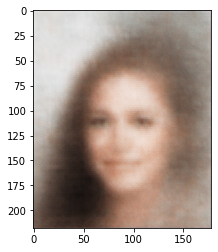

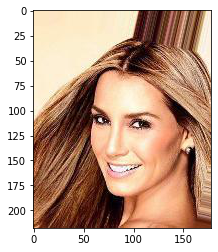

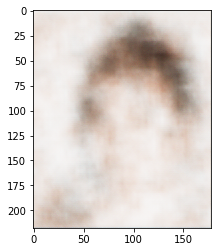

Epoch: 0 [1000/30000 (0%)]	Loss : 510.689570


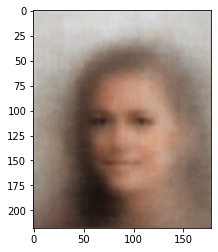

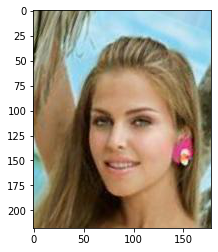

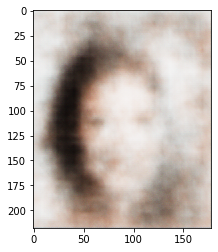

Epoch: 0 [2000/30000 (0%)]	Loss : 509.293711


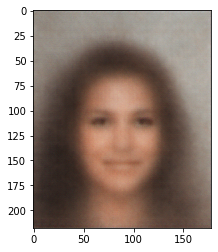

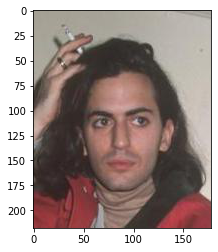

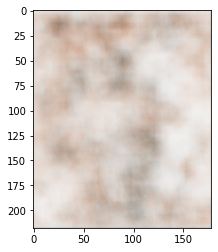

Epoch: 0 [3000/30000 (0%)]	Loss : 508.442539


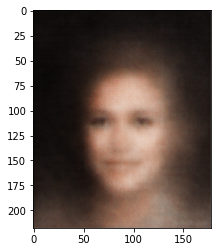

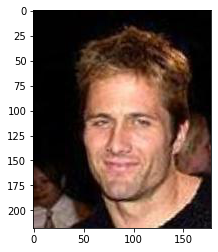

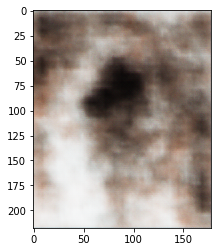

Epoch: 0 [4000/30000 (0%)]	Loss : 508.168711


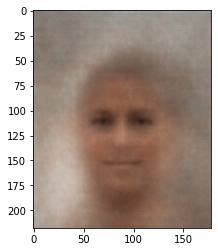

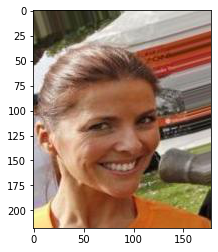

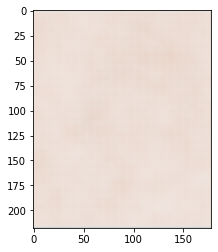

Epoch: 0 [5000/30000 (0%)]	Loss : 507.764336


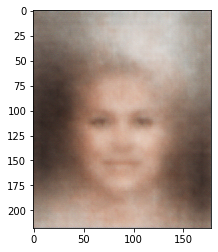

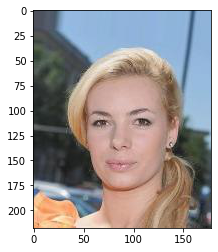

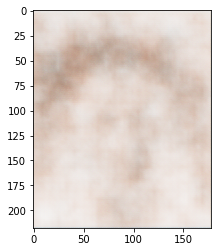

Epoch: 0 [6000/30000 (0%)]	Loss : 506.841289


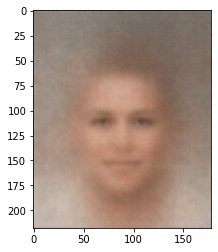

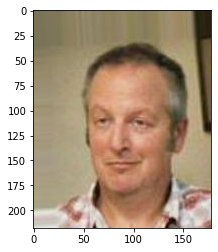

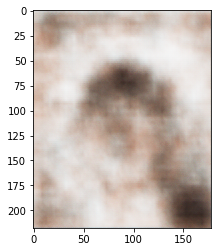

Epoch: 0 [7000/30000 (0%)]	Loss : 507.248164


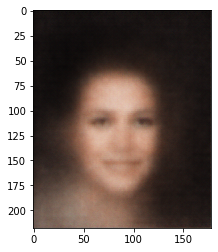

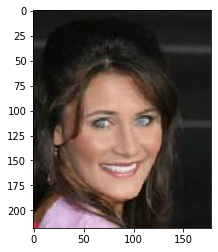

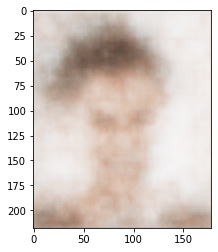

Epoch: 0 [8000/30000 (0%)]	Loss : 507.217461


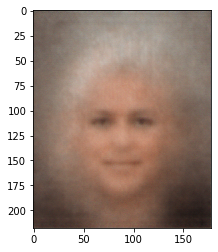

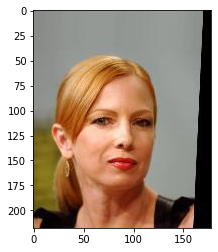

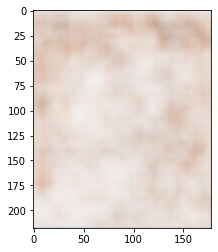

Epoch: 0 [9000/30000 (0%)]	Loss : 506.422813


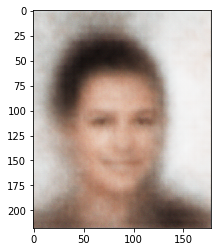

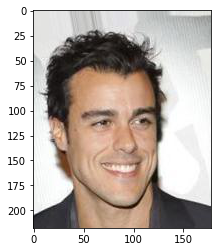

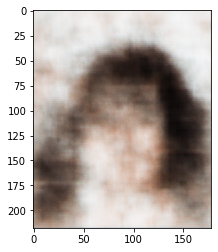

Epoch: 0 [10000/30000 (0%)]	Loss : 505.723359


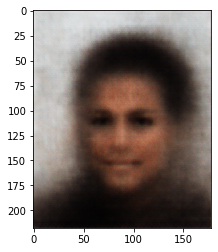

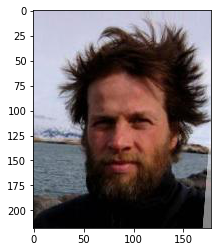

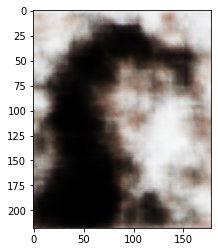

Epoch: 0 [11000/30000 (0%)]	Loss : 505.643438


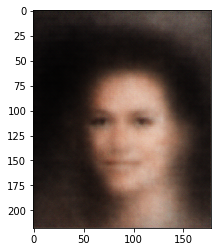

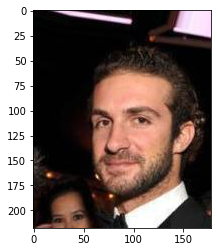

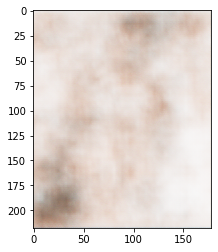

Epoch: 0 [12000/30000 (0%)]	Loss : 506.048203


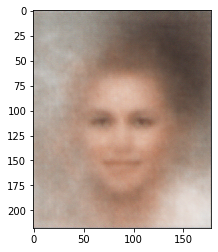

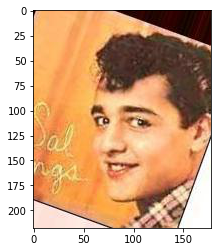

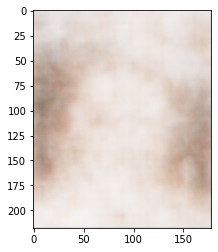

Epoch: 0 [13000/30000 (0%)]	Loss : 505.338945


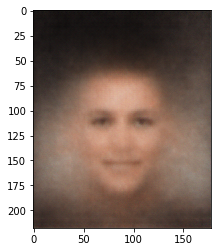

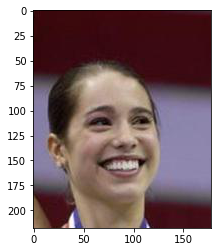

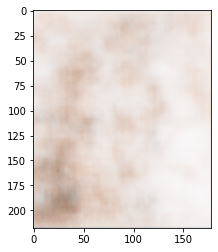

Epoch: 0 [14000/30000 (0%)]	Loss : 504.807773


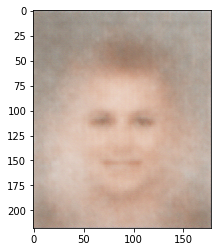

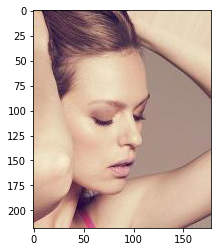

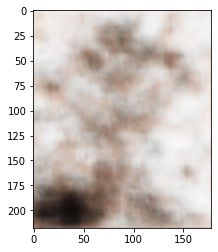

Epoch: 0 [15000/30000 (0%)]	Loss : 505.548594


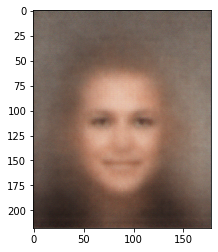

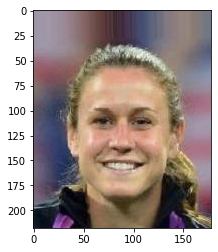

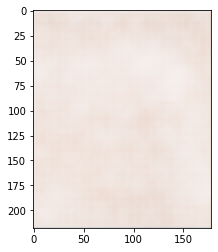

Epoch: 0 [16000/30000 (0%)]	Loss : 504.145156


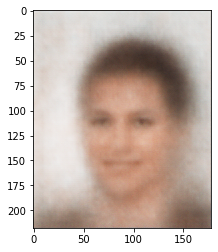

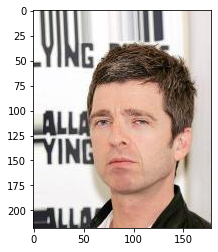

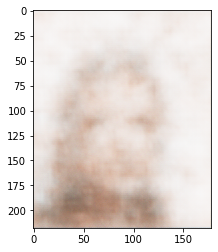

Epoch: 0 [17000/30000 (0%)]	Loss : 503.783750


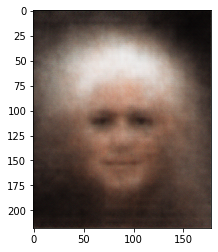

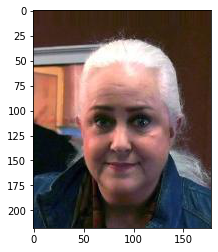

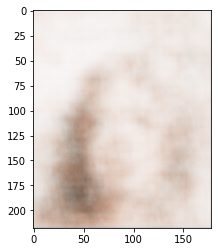

Epoch: 0 [18000/30000 (0%)]	Loss : 503.400547


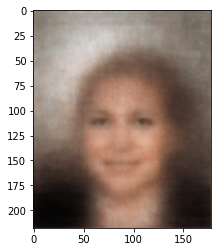

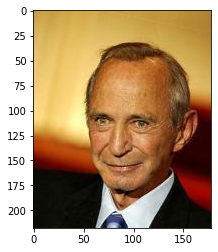

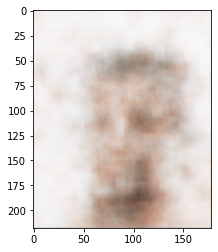

Epoch: 0 [19000/30000 (0%)]	Loss : 503.725508


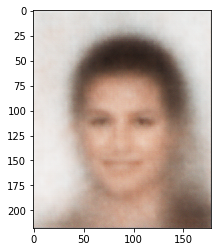

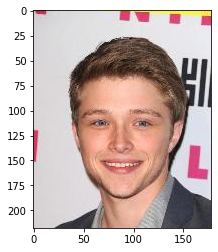

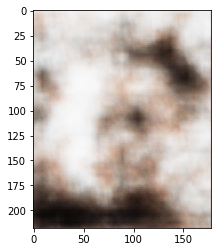

Epoch: 0 [20000/30000 (0%)]	Loss : 503.254531


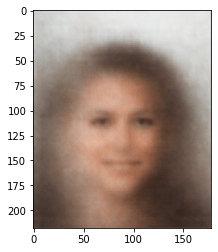

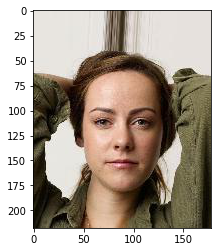

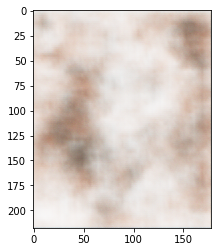

Epoch: 0 [21000/30000 (0%)]	Loss : 502.871992


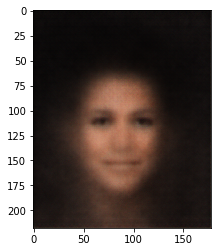

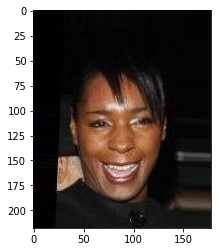

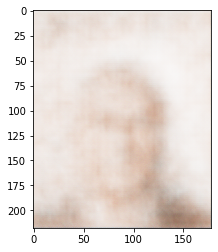

Epoch: 0 [22000/30000 (0%)]	Loss : 502.412109


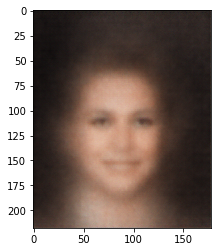

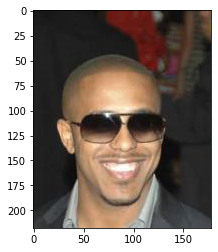

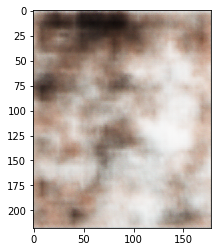

Epoch: 0 [23000/30000 (0%)]	Loss : 502.032227


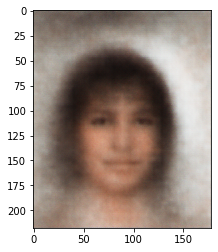

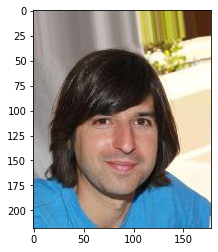

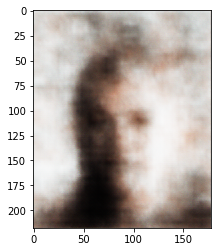

Epoch: 0 [24000/30000 (0%)]	Loss : 501.955781


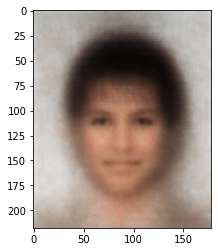

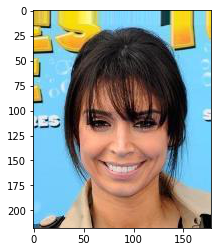

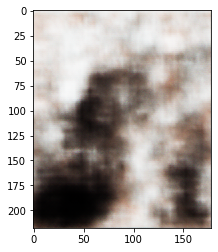

Epoch: 0 [25000/30000 (0%)]	Loss : 501.514805


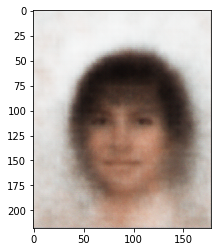

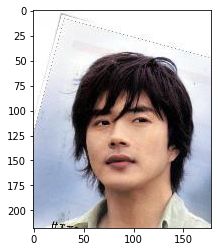

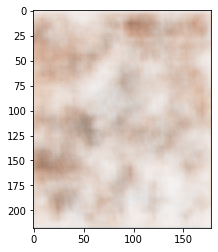

Epoch: 0 [26000/30000 (0%)]	Loss : 501.182500


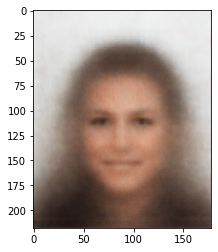

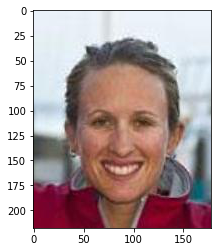

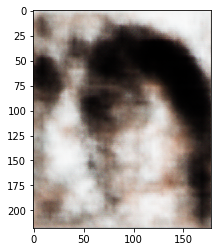

Epoch: 0 [27000/30000 (0%)]	Loss : 500.534805


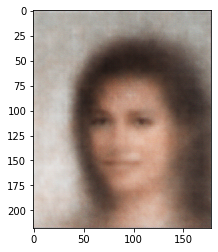

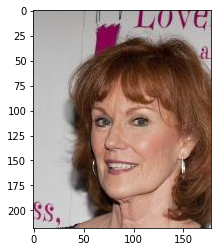

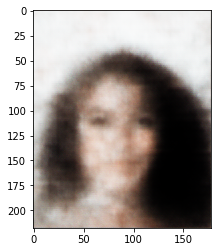

Epoch: 0 [28000/30000 (0%)]	Loss : 500.864766


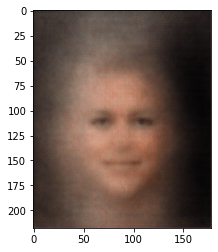

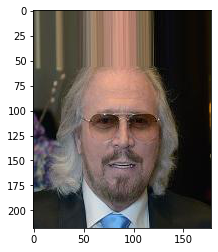

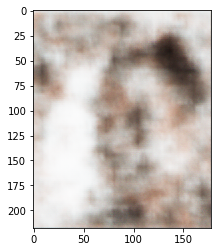

Epoch: 0 [29000/30000 (0%)]	Loss : 500.176406


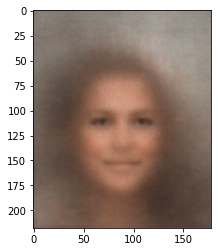

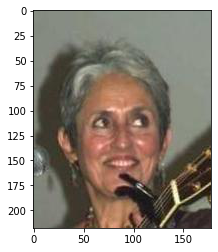

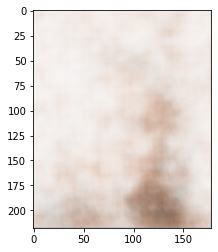

Epoch: 0 [30000/30000 (0%)]	Loss : 501.055977


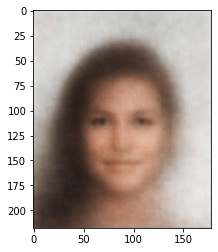

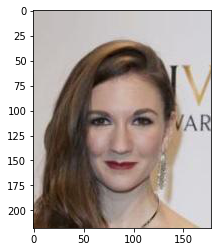

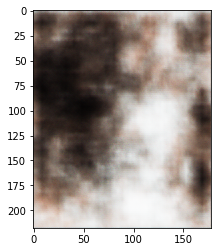

hey
Epoch: 1 [0/30000 (0%)]	Loss : 500.440352


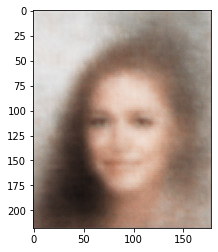

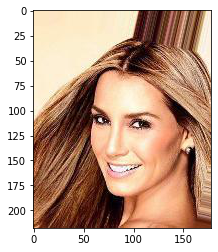

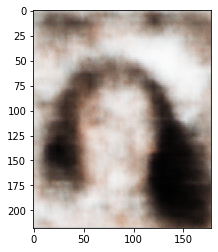

Epoch: 1 [1000/30000 (0%)]	Loss : 500.448516


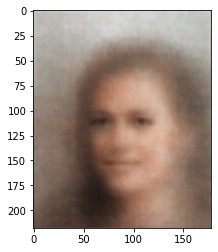

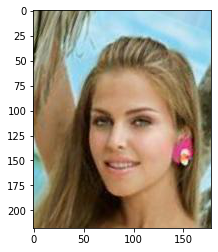

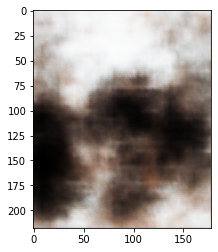

Epoch: 1 [2000/30000 (0%)]	Loss : 499.616758


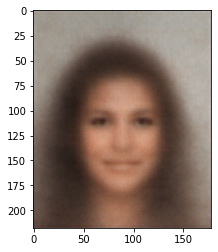

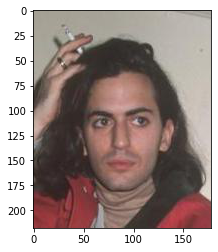

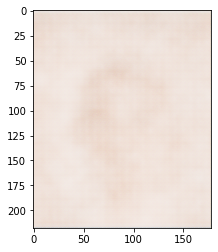

Epoch: 1 [3000/30000 (0%)]	Loss : 499.492422


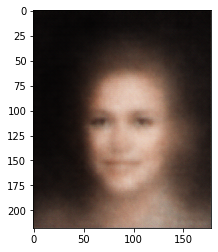

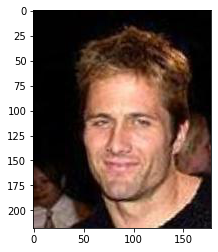

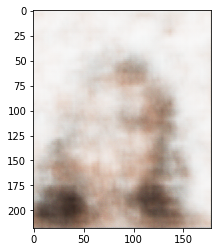

Epoch: 1 [4000/30000 (0%)]	Loss : 499.381641


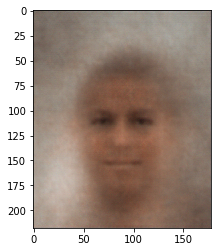

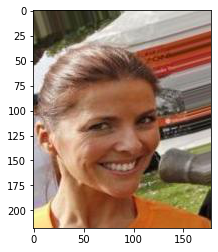

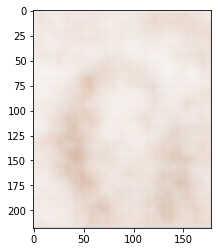

Epoch: 1 [5000/30000 (0%)]	Loss : 498.977227


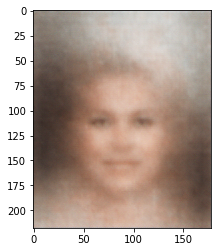

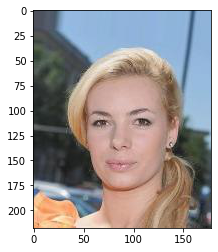

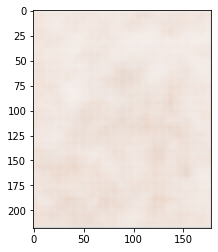

Epoch: 1 [6000/30000 (0%)]	Loss : 498.038164


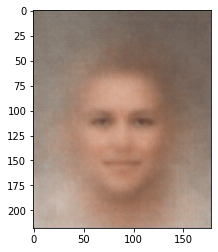

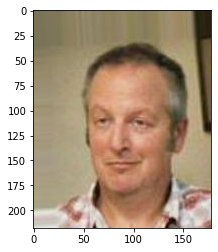

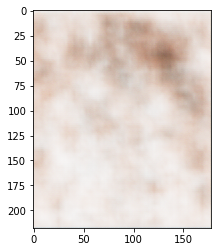

Epoch: 1 [7000/30000 (0%)]	Loss : 498.548398


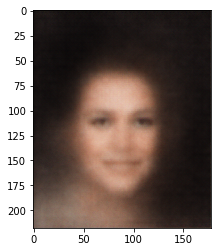

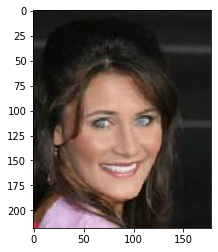

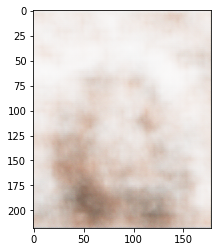

Epoch: 1 [8000/30000 (0%)]	Loss : 498.574961


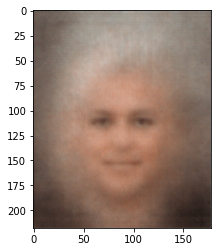

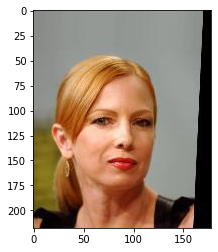

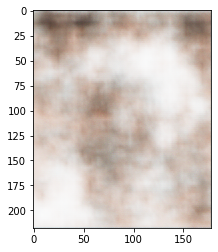

Epoch: 1 [9000/30000 (0%)]	Loss : 497.818594


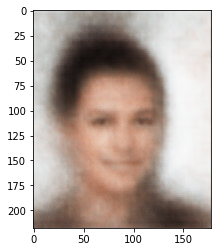

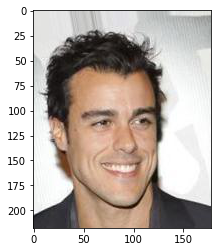

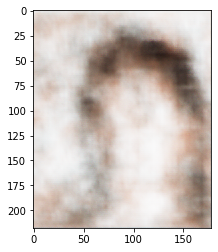

Epoch: 1 [10000/30000 (0%)]	Loss : 497.048945


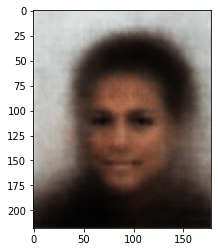

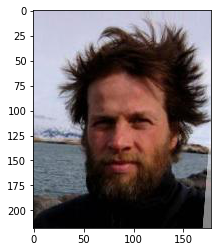

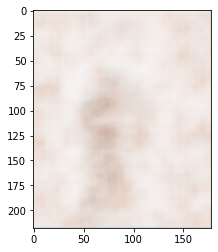

Epoch: 1 [11000/30000 (0%)]	Loss : 496.986562


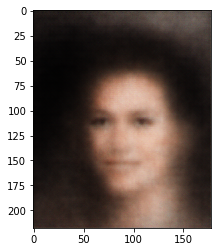

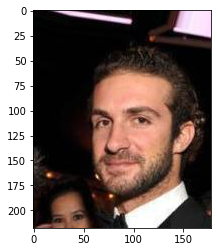

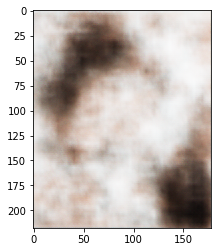

Epoch: 1 [12000/30000 (0%)]	Loss : 497.418828


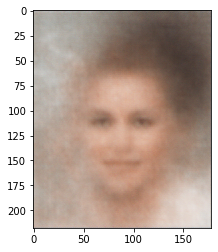

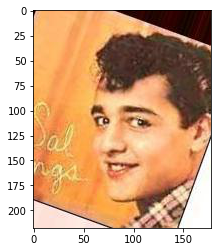

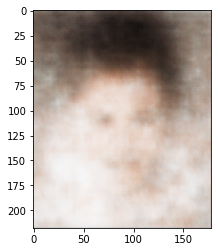

Epoch: 1 [13000/30000 (0%)]	Loss : 496.738711


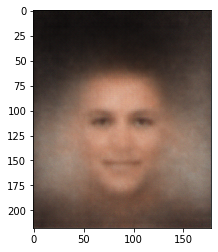

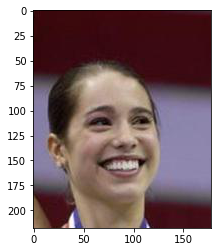

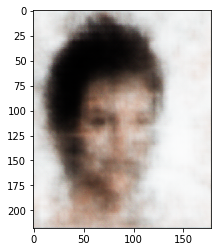

Epoch: 1 [14000/30000 (0%)]	Loss : 496.165898


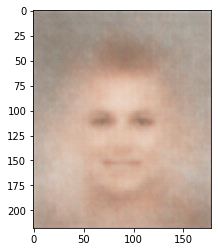

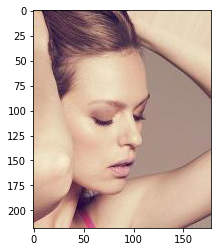

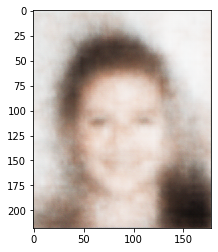

In [ ]:
latent2 = 10
# 6# TO DO: Choose latent space dimension.

if not torch.cuda.is_available():
    print("madafaka")
    model_2 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent2)
    #model_2.weight_init(mean=0, std=0.02)
    model_2.load_state_dict(torch.load("/content/gdrive/My Drive/Colab Notebooks/vae_model10day3_E_2_I_55.pth", map_location=torch.device('cpu')))
    model =  train(num_epochs,batch_size,dataset_size,model_2)
print("tzlil a 0")

Plot the train and the validation loss graphs. Explain what is seen.

In [ ]:
# Your Code Goes Here


Visualize, from the test dataset, an original image against a reconstructed image. Has the model reconstructed the image successfully? Are the images identical? Explain.

In [ ]:
# Your Code Goes Here

 What will happened if we choose extremely high dimension for the latent space?

In [ ]:
# Write your explanation here

 
Did you output blurry reconstructed images? If the answer is yes, explain what could be the reason. If you got sharp edges and fine details, explain what you did in order to achieve that. 

Note: If you got blurry reconstructed images, just explain why. You dont need to change your code or retrain your model for better results (as long as your results can be interpreted as a human face).
 

In [ ]:
# Write your explanation here

## Question 6: Generate New Faces (10 %)

Now, for the fun part!

We are going to generate new celebrity faces with our VAE models. A function for new faces generation is given to you. Modify it (if needed) to fit your code. 



In [ ]:
# creates random noise sample in the correct shape.
def generate_faces(model, grid_size, latent):
  #  model.eval()
    dummy = torch.empty([batch_size,latent])
    z = torch.randn_like(dummy).to(device)

    #insert the random noise to the decoder to create new samples.
    sample = model.decode(z)
    new_face_list = []

    j=0
    while j < grid_size: 
        new_face_list.append(sample[j])
        j+=1

    grid = make_grid(new_face_list)
    show(grid)

**Model 1 ($L = 3$) results:**

In [ ]:
generate_faces(model,grid_size=32,latent=latent1)

**Model 2 results:**

In [ ]:
generate_faces(model_2,grid_size=32,latent=latent2)

*Q1:* Generate new faces with VAE model with latent space dimension = 3. Did you get diverse results? What are the most prominent features that the latent space capture? 

*Q2:* Generate new faces with VAE model with your decision for latent space dimension. What are the most prominent features that the latent space capture? 

*Q3:* What are the differences? Your results are similar to the dataset images? Do you get realistic images for your chosen latent space dimension? If not, change your decision or your network to acheive more realistic results.

In [ ]:
#YOUR ANSWERS GOES HERE

# Q1 Answer: 

# Q2 Answer: 

# Q3 Answer: 

## Question 7: Extrapolation (10 %)

Recall that we extrapolate in the images domain in Question 2, part (c).
Here, extrapolate in the latent space domain to generate new images.

Define $\beta = [0, 0.1, 0.2, ... , 0.9, 1]$ and randomly sample from $Z \sim \mathcal{N(0,1)}$ 2 different samples and generate 2 new face images: $X_1, X_2$.

Extrapolate in the latent domain as follows: $\beta_i\cdot Z_1 + (1-\beta_i)\cdot Z_2$ for each $\beta_i \in \beta$.

Plot the extrapolation of the images for each $\beta$ and discuss your results. 
Repeat the process for 3 different samples.



In [ ]:
# YOUR CODE GOES HERE